<a href="https://colab.research.google.com/github/joaoAngelo2/hand-landmark/blob/main/hand_landmark_collection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

importando as bibliotecas

In [2]:
import os
import io
import cv2
import base64
import numpy as np
import IPython.display as display
from google.colab import output
from PIL import Image
import base64
import time

In [29]:
import zipfile
with zipfile.ZipFile('/content/archive.zip', 'r') as zip_ref:
    zip_ref.extractall('/content')


importando as bibliotecas do mediapipe

In [4]:
!python -m pip install mediapipe


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 57.5 MB/s eta 0:00:00


In [5]:
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
import cv2
import matplotlib.pyplot as plt
import pickle

In [6]:
!wget https://storage.googleapis.com/mediapipe-models/hand_landmarker/hand_landmarker/float16/latest/hand_landmarker.task

--2025-02-15 20:25:02--  https://storage.googleapis.com/mediapipe-models/hand_landmarker/hand_landmarker/float16/latest/hand_landmarker.task
Resolving storage.googleapis.com (storage.googleapis.com)... 108.177.98.207, 74.125.197.207, 74.125.135.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|108.177.98.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7819105 (7.5M) [application/octet-stream]
Saving to: ‘hand_landmarker.task’

hand_landmarker.tas 100%[===================>]   7.46M  --.-KB/s    in 0.1s    

2025-02-15 20:25:02 (51.9 MB/s) - ‘hand_landmarker.task’ saved [7819105/7819105]



In [34]:
model_path = ("hand_landmarker.task")

In [35]:
base_options = python.BaseOptions(model_asset_path="/content/hand_landmarker.task")
options = vision.HandLandmarkerOptions(base_options=base_options,
                                       num_hands=2)

detector = vision.HandLandmarker.create_from_options(options)

desenhar as landmarks

In [36]:

from mediapipe import solutions
from mediapipe.framework.formats import landmark_pb2
import numpy as np
import cv2

MARGIN = 10  # pixels
FONT_SIZE = 1
FONT_THICKNESS = 1
HANDEDNESS_TEXT_COLOR = (88, 205, 54) # vibrant green

def draw_landmarks_on_image(rgb_image, detection_result):
  hand_landmarks_list = detection_result.hand_landmarks
  handedness_list = detection_result.handedness
  annotated_image = np.copy(rgb_image)

  # Loop through the detected hands to visualize.
  for idx in range(len(hand_landmarks_list)):
    hand_landmarks = hand_landmarks_list[idx]
    handedness = handedness_list[idx]

    # Draw the hand landmarks.
    hand_landmarks_proto = landmark_pb2.NormalizedLandmarkList()
    hand_landmarks_proto.landmark.extend([
      landmark_pb2.NormalizedLandmark(x=landmark.x, y=landmark.y, z=landmark.z) for landmark in hand_landmarks
    ])
    solutions.drawing_utils.draw_landmarks(
      annotated_image,
      hand_landmarks_proto,
      solutions.hands.HAND_CONNECTIONS,
      solutions.drawing_styles.get_default_hand_landmarks_style(),
      solutions.drawing_styles.get_default_hand_connections_style())

    # Get the top left corner of the detected hand's bounding box.
    height, width, _ = annotated_image.shape
    x_coordinates = [landmark.x for landmark in hand_landmarks]
    y_coordinates = [landmark.y for landmark in hand_landmarks]
    text_x = int(min(x_coordinates) * width)
    text_y = int(min(y_coordinates) * height) - MARGIN

    # Draw handedness (left or right hand) on the image.
    cv2.putText(annotated_image, f"{handedness[0].category_name}",
                (text_x, text_y), cv2.FONT_HERSHEY_DUPLEX,
                FONT_SIZE, HANDEDNESS_TEXT_COLOR, FONT_THICKNESS, cv2.LINE_AA)

  return annotated_image

In [37]:
dados = []
rotulos = []

DATA_SET = '/content/dataset'

for i in os.listdir(DATA_SET):
    for img_dir in os.listdir(os.path.join(DATA_SET, i)):
        print(i)
        img_path = os.path.join(DATA_SET, i, img_dir)
        img = cv2.imread(img_path)
        if img is None:
            continue
        imgRgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        dados_aux = []
        mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=img)
        resultado = detector.detect(mp_image)

        if resultado.hand_landmarks :
            for hand_landmarks in resultado.hand_landmarks:
                  #annotated_image = draw_landmarks_on_image(imgRgb, resultado)
                  #cv2_imshow(cv2.cvtColor(annotated_image, cv2.COLOR_RGB2BGR)) mostrar as landmarks desenhado
                for j in range(len(hand_landmarks)):
                    #print(hand_landmarks[i]) imprime as landmarks
                    x = hand_landmarks[j].x
                    y = hand_landmarks[j].y
                    dados_aux.append(x)
                    dados_aux.append(y)
            if(len(dados_aux) ==42):
                  dados.append(dados_aux)
                  rotulos.append(i)

with open("dados.pickle", "wb") as f:
    pickle.dump({'dados': dados, 'rotulos': rotulos}, f)

rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock
rock


treinando o classificador

In [38]:
dados_dic = pickle.load(open('dados.pickle','rb'))

treinando um modelo

In [39]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [40]:
data = np.array(dados_dic['dados'])
labels = np.asarray(dados_dic['rotulos'])

dividindo entre treino e test

In [41]:
print(data.shape)
print(labels.shape)

(200, 42)
(200,)


In [42]:
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, shuffle=True, stratify=labels)


In [43]:
model = RandomForestClassifier()
model.fit(X_train, y_train)

RandomForestClassifier()

In [44]:
y_classificacao = model.predict(X_test)

In [45]:
score = accuracy_score(y_classificacao, y_test)
print('Acurácia:', score)

Acurácia: 0.975


In [61]:
f = open('modelo.p', 'wb')
pickle.dump({'model': model}, f)
f.close()

In [63]:
from sklearn.ensemble import RandomForestClassifier
import joblib



joblib.dump(model, "modelo_rf.pkl")

['modelo_rf.pkl']

In [66]:
import skl2onnx
from skl2onnx import convert_sklearn
from skl2onnx.common.data_types import FloatTensorType

initial_type = [("input", FloatTensorType([None, 42]))]
onnx_model = convert_sklearn(model, initial_types=initial_type)

# Salvar o modelo ONNX
with open("modelo_rf.onnx", "wb") as f:
    f.write(onnx_model.SerializeToString())

In [59]:
import skl2onnx
import joblib
from skl2onnx import convert_sklearn
from skl2onnx.common.data_types import FloatTensorType

# Carregar modelo do joblib
modelo = joblib.load("modelo.joblib")

# Definir tipo de entrada do modelo
input_type = [("input", FloatTensorType([None, 4]))]  # Ajuste conforme necessário

# Converter para ONNX
modelo_onnx = convert_sklearn(modelo, initial_types=input_type)

# Salvar modelo ONNX
with open("modelo.onnx", "wb") as f:
    f.write(modelo_onnx.SerializeToString())


Previsão do modelo: ['paper']


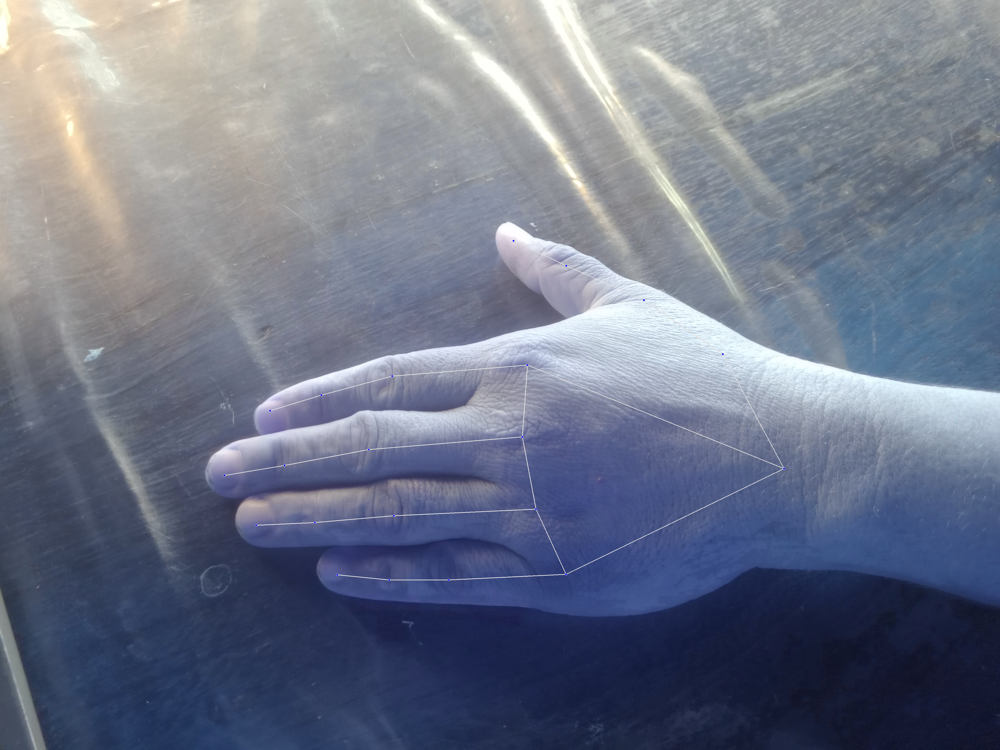

In [67]:
import cv2
import mediapipe as mp
from google.colab.patches import cv2_imshow
import numpy as np
import pickle

# Inicializar o MediaPipe Hands
mp_hands = mp.solutions.hands
mp_draw = mp.solutions.drawing_utils
detector = mp_hands.Hands(min_detection_confidence=0.5, min_tracking_confidence=0.5)

# Carregar o modelo
model_dict = pickle.load(open('/content/modelo.p', 'rb'))
model = model_dict['model']

# Carregar a imagem
img = cv2.imread('/IMG_20250215_174914.jpg')

# Converter de BGR para RGB
imgRgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Processar a imagem
resultado = detector.process(imgRgb)

# Verificar se há mãos detectadas
if resultado.multi_hand_landmarks:
    dados_aux = []

    # Para cada mão detectada
    for hand_landmarks in resultado.multi_hand_landmarks:
        mp_draw.draw_landmarks(img, hand_landmarks, mp_hands.HAND_CONNECTIONS)

        # Extrair as coordenadas dos landmarks da mão
        for landmark in hand_landmarks.landmark:
            x = landmark.x
            y = landmark.y
            dados_aux.append(x)
            dados_aux.append(y)

    # Fazer a previsão com o modelo
    dados_aux = np.array(dados_aux).reshape(1, -1)  # Reshaping para o formato adequado
    previsao = model.predict(dados_aux)

    print("Previsão do modelo:", previsao)

    # Exibir a imagem com as landmarks desenhadas
    cv2_imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
else:
    print("Nenhuma mão detectada.")


In [33]:
import os

def apagar_arquivos(caminho, extensao=None):
    """
    Apaga arquivos em um diretório específico.

    Parâmetros:
    - caminho (str): O diretório onde os arquivos serão apagados.
    - extensao (str, opcional): Especifique uma extensão (ex: '.jpg') para apagar apenas arquivos desse tipo.
    """
    if not os.path.exists(caminho):
        print("O diretório não existe.")
        return

    arquivos = os.listdir(caminho)
    for arquivo in arquivos:
        caminho_arquivo = os.path.join(caminho, arquivo)
        if os.path.isfile(caminho_arquivo):
            if extensao is None or arquivo.endswith(extensao):
                os.remove(caminho_arquivo)
                print(f"Arquivo removido: {arquivo}")

# Exemplo de uso:
# Apagar todos os arquivos do diretório "/content/dataset"
# apagar_arquivos("/content/dataset")

# Apagar apenas arquivos .jpg do diretório "/content/dataset"
# apagar_arquivos("/content/dataset", ".jpg")
apagar_arquivos("/content/rps-cv-images/paper")

Arquivo removido: Y0XtXW0pn979O6KK.png
Arquivo removido: d5FmD95HmhodiITj.png
Arquivo removido: gFqfkMtX39sTkrSB.png
Arquivo removido: oBKuveyTYAhqtKSw.png
Arquivo removido: 9szmJOWlXxEbjDGV.png
Arquivo removido: CbiqUiChqkXHb8jk.png
Arquivo removido: FcIIjteQItMuIuRa.png
Arquivo removido: PLvidx6rZDuRENbv.png
Arquivo removido: PwkqvoT0noMITNaF.png
Arquivo removido: kVKp9kJji4urjoMs.png
Arquivo removido: jaxChUvakWAN9eTs.png
Arquivo removido: N4D5tleMLbP1Au5D.png
Arquivo removido: eQaNnPaHwKsOJaYq.png
Arquivo removido: et9oIiGQmAgwy7GK.png
Arquivo removido: tfMCcOsRUhEJZF6I.png
Arquivo removido: lhr6oNI2jMsi0Z6A.png
Arquivo removido: IxQ1CVKgnpiD0HfY.png
Arquivo removido: xhKyuxHPC3RnoLD0.png
Arquivo removido: ZveWRNmdKejc1c4w.png
Arquivo removido: wKiW95hiPu8zQhwV.png
Arquivo removido: WVfwcOw6nXcg4xER.png
Arquivo removido: LkNkNVjTRm5Gr9NQ.png
Arquivo removido: WUJ02oAbtzoPF4oo.png
Arquivo removido: mkUctpckc3vjOwKa.png
Arquivo removido: wQQCLOgW5qXxkwli.png
Arquivo removido: YkZMyyS